In [1]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cv2
from PIL import Image
from skimage.transform import resize
from sklearn.model_selection import train_test_split

import keras
import tensorflow as tf
from keras import backend as K

K.set_image_data_format('channels_last')

Using TensorFlow backend.


In [2]:
print(os.listdir("data/"))

['test', 'train']


## EDA 

Get a brief understanding of the data

In [3]:
# training data path
path_train = "data/train/"
file_list_train = os.listdir(path_train)
file_list_train[:20]

['000_HC.png',
 '000_HC_Mask.png',
 '001_HC.png',
 '001_HC_Mask.png',
 '002_HC.png',
 '002_HC_Mask.png',
 '003_HC.png',
 '003_HC_Mask.png',
 '004_HC.png',
 '004_HC_Mask.png',
 '005_HC.png',
 '005_HC_Mask.png',
 '006_HC.png',
 '006_HC_Mask.png',
 '007_HC.png',
 '007_HC_Mask.png',
 '008_HC.png',
 '008_HC_Mask.png',
 '009_HC.png',
 '009_HC_Mask.png']

In [4]:
path_test = "data/test/"
file_list_test = os.listdir(path_test)
file_list_test[:20]

['000_HC.png',
 '001_HC.png',
 '002_HC.png',
 '003_HC.png',
 '004_HC.png',
 '005_HC.png',
 '006_HC.png',
 '007_HC.png',
 '008_HC.png',
 '009_HC.png',
 '010_HC.png',
 '011_HC.png',
 '012_HC.png',
 '013_HC.png',
 '014_HC.png',
 '015_HC.png',
 '016_HC.png',
 '017_HC.png',
 '018_HC.png',
 '019_HC.png']

From the original data description, in the training set, Each file has the form of either "subject_imageNum.tif" or "subject_imageNum_mask.tif", so we can extract `subject` and `imageNum` from each file name by using regular expression. `"[0-9]+"` means to find the first consecutive number.<br/>

Files in test set do not contain these type of information.

__Sort the files in the training set in ascending order and seperate it into US images and masks__


In [5]:
# reg = re.compile("[0-9]+")

# temp1 = list(map(lambda x: reg.match(x).group(), file_list_train)) 
# temp1 = list(map(int, temp1))

# temp1

In [6]:
# temp2 = list(map(lambda x: reg.match(x.split("_")[1]).group(), file_list_train))
# temp2 = list(map(int, temp2))

# temp2

In [7]:
# file_list_train = [x for _,_,x in sorted(zip(temp1, temp2, file_list_train))]
file_list_train[:20]

['000_HC.png',
 '000_HC_Mask.png',
 '001_HC.png',
 '001_HC_Mask.png',
 '002_HC.png',
 '002_HC_Mask.png',
 '003_HC.png',
 '003_HC_Mask.png',
 '004_HC.png',
 '004_HC_Mask.png',
 '005_HC.png',
 '005_HC_Mask.png',
 '006_HC.png',
 '006_HC_Mask.png',
 '007_HC.png',
 '007_HC_Mask.png',
 '008_HC.png',
 '008_HC_Mask.png',
 '009_HC.png',
 '009_HC_Mask.png']

Seperating the US images and masks which will be used as training examples and training targets respectively. Each image in the training set 

In [8]:
train_image = []
train_mask = []
for idx, item in enumerate(file_list_train):
    if idx % 2 == 0:
        train_image.append(item)
    else:
        train_mask.append(item)
print("Number of US images is {}".format(len(train_image)))
print("Number of US masks is {}".format(len(train_mask)))  
print(train_image[:10],"\n" ,train_mask[:10])

Number of US images is 999
Number of US masks is 999
['000_HC.png', '001_HC.png', '002_HC.png', '003_HC.png', '004_HC.png', '005_HC.png', '006_HC.png', '007_HC.png', '008_HC.png', '009_HC.png'] 
 ['000_HC_Mask.png', '001_HC_Mask.png', '002_HC_Mask.png', '003_HC_Mask.png', '004_HC_Mask.png', '005_HC_Mask.png', '006_HC_Mask.png', '007_HC_Mask.png', '008_HC_Mask.png', '009_HC_Mask.png']


In [9]:
train = [item.split('.')[0]+"_Mask.png" for item in train_image]
train == train_mask

True

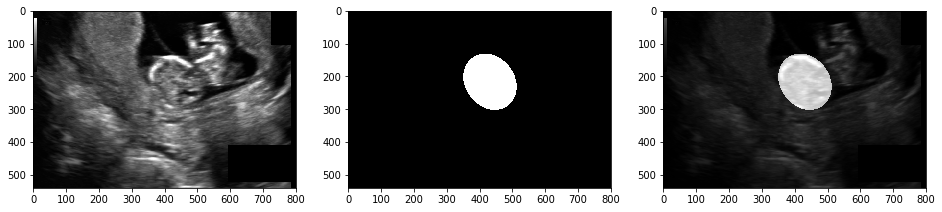

In [10]:
# Display the first image and mask of the first subject.
image1 = np.array(Image.open(path_train+"009_HC.png"))
image1_mask = np.array(Image.open(path_train+"009_HC_Mask.png"))
# binary inverse the mask
image1_mask = np.ma.masked_where(image1_mask == 0, image1_mask)

fig, ax = plt.subplots(1,3,figsize = (16,12))
ax[0].imshow(image1, cmap = 'gray')

ax[1].imshow(image1_mask, cmap = 'gray')

ax[2].imshow(image1, cmap = 'gray', interpolation = 'none')
ax[2].imshow(image1_mask, cmap = 'jet', interpolation = 'none', alpha = 0.7)


In [11]:
print(image1.shape)

(540, 800)


In [12]:
## Storing data
X = []
y = []
for image, mask in zip(train_image, train_mask):
    X.append(np.array(Image.open(path_train+image)))
    y.append(np.array(Image.open(path_train+mask)))

In [13]:
X = np.array(X)
y = np.array(y)

print("X_shape : ", X.shape)
print("y_shape : ", y.shape)

X_shape :  (999,)
y_shape :  (999,)


# Model building and training

Since the whole data size is quite big, it may lead to over-memory if we load whole data on X and y as we did earier. <br/>
So we use `data generator` that allow us to load a few of data and to use them to train our model.<br/>
Before that, we first use only 100 data to check our model works well

In [14]:
from keras.models import Model, Input, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [15]:
# Randomly choose the indices of data used to train our model.
indices = np.random.choice(range(len(train_image)), replace = False ,size = 100)
train_image_sample = np.array(train_image)[indices]
train_mask_sample = np.array(train_mask)[indices]

In [16]:
# Build the dataset.
IMG_HEIGHT = 96
IMG_WIDTH = 96

X = np.empty(shape = (len(indices), IMG_HEIGHT, IMG_WIDTH), dtype = 'float32')
y = np.empty(shape = (len(indices), IMG_HEIGHT, IMG_WIDTH), dtype = 'float32')

for i, (image_path, mask_path) in enumerate(zip(train_image_sample, train_mask_sample)):
    image = cv2.imread("data/train/" + image_path, 0)
    mask = cv2.imread("data/train/" + mask_path, 0)
    
    image = cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
    mask = cv2.resize(mask, (IMG_HEIGHT, IMG_WIDTH),interpolation = cv2.INTER_AREA)
    
    X[i] = image
    y[i] = mask

X = X[:,:,:,np.newaxis] / 255
y = y[:,:,:,np.newaxis] / 255
print("X shape : ", X.shape)
print("y shape : ", y.shape)

X shape :  (100, 96, 96, 1)
y shape :  (100, 96, 96, 1)


[](http://)Now we define the dice loss and metrics. I refered to this [site](https://github.com/jocicmarko/ultrasound-nerve-segmentation/blob/master/train.py).

In [17]:
smooth = 1.

def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)


def dice_coef_loss(y_true, y_pred):
    return -dice_coef(y_true, y_pred)

## U-Net Structure

Let's first construct the U-net model, which is shown below.

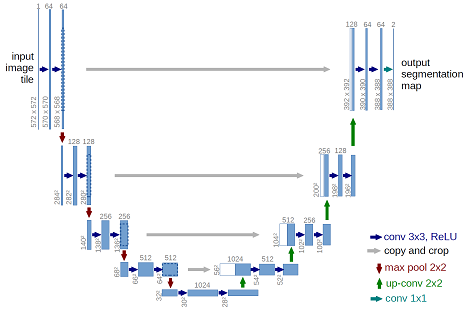
The provided model is basically a convolutional auto-encoder, but with a twist - it has skip connections from encoder layers to decoder layers that are on the same "level".

In [18]:
inputs = Input((IMG_HEIGHT, IMG_WIDTH, 1))

conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
conv3 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool3)
conv4 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv4)
pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

up6 = concatenate([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5), conv4], axis=3)
conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up6)
conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

up7 = concatenate([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6), conv3], axis=3)
conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

up8 = concatenate([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7), conv2], axis=3)
conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)

up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8), conv1], axis=3)
conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
conv9 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv9)

conv10 = Conv2D(1, (1, 1), activation='sigmoid')(conv9)

model = Model(inputs=[inputs], outputs=[conv10])
model.compile(optimizer=Adam(lr = 1e-5), loss=dice_coef_loss, metrics=[dice_coef])

In [19]:

results = model.fit(X, y, validation_split = 0.1, batch_size=4, epochs=20)
model.summary()




Train on 90 samples, validate on 10 samples
Epoch 1/20





90/90 [==============================] - 10s 106ms/step - loss: -0.3833 - dice_coef: 0.3833 - val_loss: -0.3920 - val_dice_coef: 0.3920
Epoch 2/20
90/90 [==============================] - 0s 5ms/step - loss: -0.3836 - dice_coef: 0.3836 - val_loss: -0.3928 - val_dice_coef: 0.3928
Epoch 3/20
90/90 [==============================] - 0s 5ms/step - loss: -0.3831 - dice_coef: 0.3831 - val_loss: -0.3938 - val_dice_coef: 0.3938
Epoch 4/20
90/90 [==============================] - 0s 5ms/step - loss: -0.3852 - dice_coef: 0.3852 - val_loss: -0.3952 - val_dice_coef: 0.3952
Epoch 5/20
90/90 [==============================] - 0s 5ms/step - loss: -0.3883 - dice_coef: 0.3883 - val_loss: -0.3978 - val_dice_coef: 0.3978
Epoch 6/20
90/90 [==============================] - 0s 5ms/step - loss: -0.3908 - dice_coef: 0.3908 - val_loss: -0.4060 - val_dice_coef: 0.4060
Epoch 7/20
90/90 [==============================] - 0s 5ms/step - loss: -0.4177 -

It works on the small sample of the training set. Now, it's time to move on to the whole dataset and using image generator to load the dataset.

__Define the image_generator__

In [20]:
def Generator(X_list, y_list, batch_size = 16):
    c = 0

    while(True):
        X = np.empty((batch_size, IMG_HEIGHT, IMG_WIDTH), dtype = 'float32')
        y = np.empty((batch_size, IMG_HEIGHT, IMG_WIDTH), dtype = 'float32')
        
        for i in range(c,c+batch_size):
            image = X_list[i]
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            mask =  y_list[i]
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
            image = cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_AREA)
            mask = cv2.resize(mask, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_AREA)
    
            X[i - c] = image
            y[i - c] = mask
        
        X = X[:,:,:,np.newaxis] / 255
        y = y[:,:,:,np.newaxis] / 255
        
        c += batch_size
        if(c+batch_size >= len(X_list)):
            c = 0
        yield X, y

In [21]:
train_img_aug = []
train_mask_aug = []

def augmentation(imgs, masks): 
    for img, mask in zip(imgs, masks):
        img = cv2.imread("data/train/" + img)
        mask = cv2.imread("data/train/" + mask)
        train_img_aug.append(img)
        
        train_mask_aug.append(mask)
        img_lr = np.fliplr(img)
        mask_lr = np.fliplr(mask)
        img_up = np.flipud(img)
        mask_up = np.flipud(mask)
        img_lr_up = np.flipud(img_lr)
        mask_lr_up = np.flipud(mask_lr)
        img_up_lr = np.fliplr(img_up)
        mask_up_lr = np.fliplr(mask_up)
        train_img_aug.append(img_lr)
        train_mask_aug.append(mask_lr)
        train_img_aug.append(img_up)
        train_mask_aug.append(mask_up)
        train_img_aug.append(img_lr_up)
        train_mask_aug.append(mask_lr_up)
        train_img_aug.append(img_up_lr)
        train_mask_aug.append(mask_up_lr)

In [22]:
augmentation(train_image, train_mask)
print(len(train_image))
print(len(train_img_aug))

999
4995


In [23]:
X_train, X_val, y_train, y_val = train_test_split(train_img_aug, train_mask_aug, test_size = 0.2, random_state = 1)

epochs = 100
batch_size = 32
steps_per_epoch = int(len(X_train) / batch_size)
validation_steps = int(len(X_val) / batch_size)

train_gen = Generator(X_train, y_train, batch_size = batch_size)
val_gen = Generator(X_val, y_val, batch_size = batch_size)

# Define necessary callbacks
checkpointer = ModelCheckpoint(filepath = 'best_model_96.h5', monitor='val_dice_coef', verbose=1, save_best_only=True, mode='max')
model = Model(inputs=[inputs], outputs=[conv10])
model.compile(optimizer=Adam(lr = 1e-5), loss=dice_coef_loss, metrics=[dice_coef])

In [24]:
results = model.fit_generator(train_gen, steps_per_epoch=steps_per_epoch, epochs = epochs,
                             validation_data = val_gen, validation_steps = validation_steps,callbacks=[checkpointer])

Epoch 1/100
124/124 [==============================] - 23s 184ms/step - loss: -0.8320 - dice_coef: 0.8320 - val_loss: -0.8364 - val_dice_coef: 0.8364

Epoch 00001: val_dice_coef improved from -inf to 0.83641, saving model to best_model.h5
Epoch 2/100
124/124 [==============================] - 18s 148ms/step - loss: -0.8455 - dice_coef: 0.8455 - val_loss: -0.8539 - val_dice_coef: 0.8539

Epoch 00002: val_dice_coef improved from 0.83641 to 0.85394, saving model to best_model.h5
Epoch 3/100
124/124 [==============================] - 19s 150ms/step - loss: -0.8648 - dice_coef: 0.8648 - val_loss: -0.8728 - val_dice_coef: 0.8728

Epoch 00003: val_dice_coef improved from 0.85394 to 0.87283, saving model to best_model.h5
Epoch 4/100
124/124 [==============================] - 18s 149ms/step - loss: -0.8822 - dice_coef: 0.8822 - val_loss: -0.8869 - val_dice_coef: 0.8869

Epoch 00004: val_dice_coef improved from 0.87283 to 0.88685, saving model to best_model.h5
Epoch 5/100
124/124 [==============

Epoch 35/100
124/124 [==============================] - 19s 153ms/step - loss: -0.9685 - dice_coef: 0.9685 - val_loss: -0.9653 - val_dice_coef: 0.9653

Epoch 00035: val_dice_coef improved from 0.96476 to 0.96530, saving model to best_model.h5
Epoch 36/100
124/124 [==============================] - 19s 150ms/step - loss: -0.9689 - dice_coef: 0.9689 - val_loss: -0.9657 - val_dice_coef: 0.9657

Epoch 00036: val_dice_coef improved from 0.96530 to 0.96571, saving model to best_model.h5
Epoch 37/100
124/124 [==============================] - 19s 150ms/step - loss: -0.9692 - dice_coef: 0.9692 - val_loss: -0.9661 - val_dice_coef: 0.9661

Epoch 00037: val_dice_coef improved from 0.96571 to 0.96607, saving model to best_model.h5
Epoch 38/100
124/124 [==============================] - 19s 149ms/step - loss: -0.9696 - dice_coef: 0.9696 - val_loss: -0.9664 - val_dice_coef: 0.9664

Epoch 00038: val_dice_coef improved from 0.96607 to 0.96640, saving model to best_model.h5
Epoch 39/100
124/124 [======


Epoch 00069: val_dice_coef improved from 0.97151 to 0.97153, saving model to best_model.h5
Epoch 70/100
124/124 [==============================] - 19s 150ms/step - loss: -0.9769 - dice_coef: 0.9769 - val_loss: -0.9717 - val_dice_coef: 0.9717

Epoch 00070: val_dice_coef improved from 0.97153 to 0.97168, saving model to best_model.h5
Epoch 71/100
124/124 [==============================] - 18s 149ms/step - loss: -0.9771 - dice_coef: 0.9771 - val_loss: -0.9717 - val_dice_coef: 0.9717

Epoch 00071: val_dice_coef did not improve from 0.97168
Epoch 72/100
124/124 [==============================] - 19s 149ms/step - loss: -0.9773 - dice_coef: 0.9773 - val_loss: -0.9715 - val_dice_coef: 0.9715

Epoch 00072: val_dice_coef did not improve from 0.97168
Epoch 73/100
124/124 [==============================] - 19s 149ms/step - loss: -0.9774 - dice_coef: 0.9774 - val_loss: -0.9707 - val_dice_coef: 0.9707

Epoch 00073: val_dice_coef did not improve from 0.97168
Epoch 74/100
124/124 [===================

__Make predictions on the test data__

In [25]:
# sub = pd.read_csv("data/sample_submission.csv")
test_list = os.listdir("data/test")

print("The number of test data : ", len(test_list))

# # Sort the test set in ascending order.
# reg = re.compile("[0-9]+")

# temp1 = list(map(lambda x: reg.match(x).group(), test_list)) 
# temp1 = list(map(int, temp1))

# test_list = [x for _,x in sorted(zip(temp1, test_list))]

test_list[:15]

The number of test data :  335


['000_HC.png',
 '001_HC.png',
 '002_HC.png',
 '003_HC.png',
 '004_HC.png',
 '005_HC.png',
 '006_HC.png',
 '007_HC.png',
 '008_HC.png',
 '009_HC.png',
 '010_HC.png',
 '011_HC.png',
 '012_HC.png',
 '013_HC.png',
 '014_HC.png']

In [26]:
X_test = np.empty((len(test_list), IMG_HEIGHT, IMG_WIDTH), dtype = 'float32')
for i, item in enumerate(test_list):
    image = cv2.imread("data/test/" + item, 0)
    image = cv2.resize(image, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_AREA)
    X_test[i] = image
X_test = X_test[:,:,:,np.newaxis] / 255

y_pred = model.predict(X_test)

In [27]:
# def run_length_enc(label):
#     from itertools import chain
#     x = label.transpose().flatten()
#     y = np.where(x > 0)[0]
#     if len(y) < 10:  # consider as empty
#         return ''
#     z = np.where(np.diff(y) > 1)[0]
#     start = np.insert(y[z+1], 0, y[0])
#     end = np.append(y[z], y[-1])
#     length = end - start
#     res = [[s+1, l+1] for s, l in zip(list(start), list(length))]
#     res = list(chain.from_iterable(res))
#     return ' '.join([str(r) for r in res])

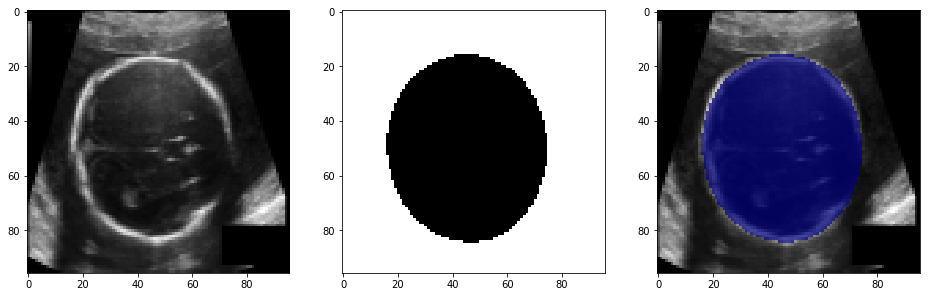

In [28]:
# Display the first image and mask of the first subject.
test1 = X_test[150].reshape((IMG_HEIGHT,IMG_WIDTH))

pred1 = y_pred[150].reshape((IMG_HEIGHT,IMG_WIDTH))
pred1 = pred1>0.5
# pred1 = cv2.resize(pred1, test1.shape, interpolation=cv2.INTER_AREA)
pred1 = np.ma.masked_where(pred1 == 0, pred1)

fig, ax = plt.subplots(1,3,figsize = (16,12))
ax[0].imshow(test1, cmap = 'gray')

ax[1].imshow(pred1, cmap = 'gray')

ax[2].imshow(test1, cmap = 'gray', interpolation = 'none')
ax[2].imshow(pred1, cmap = 'jet', interpolation = 'none', alpha = 0.7)

c:\users\ggpc\appdata\local\programs\python\python36\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


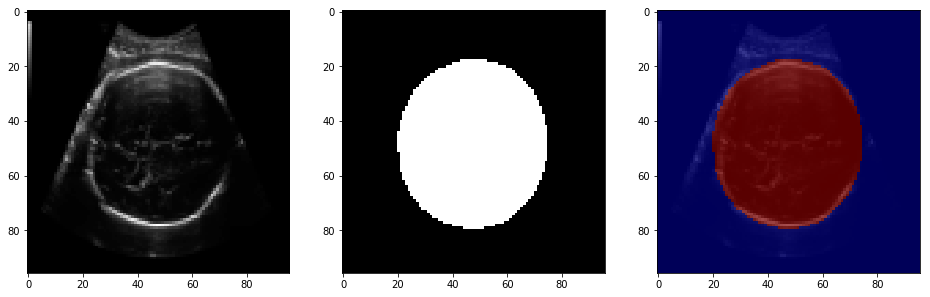

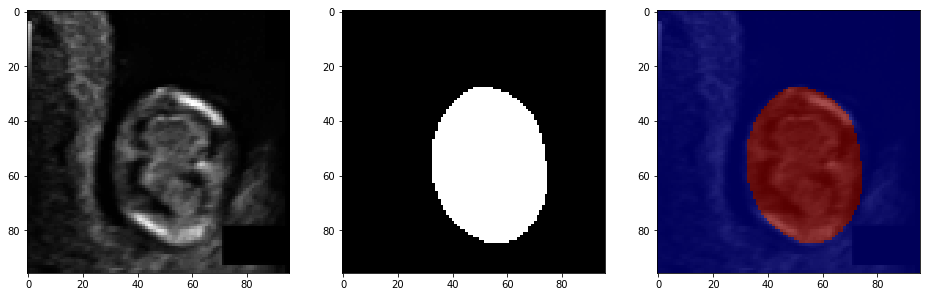

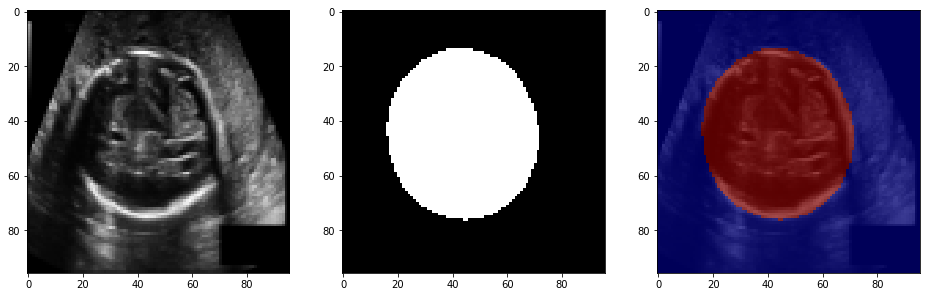

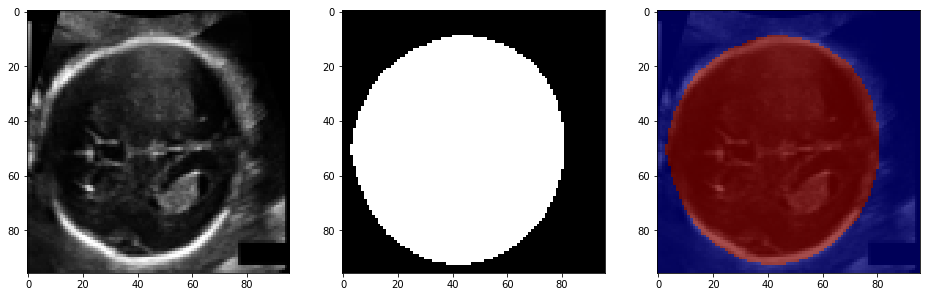

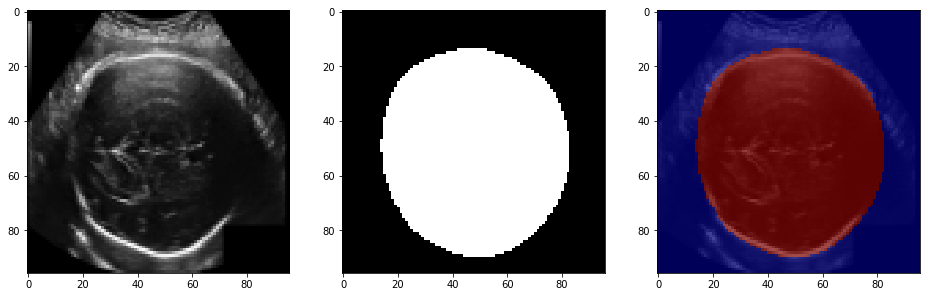

...

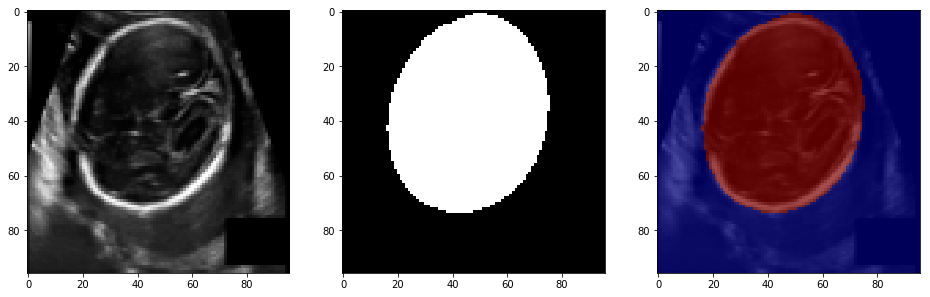

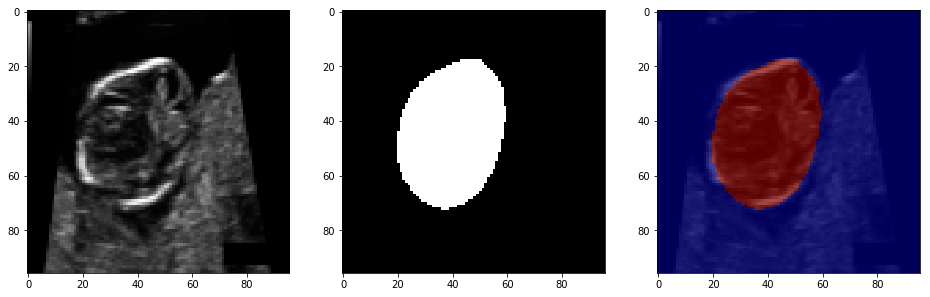

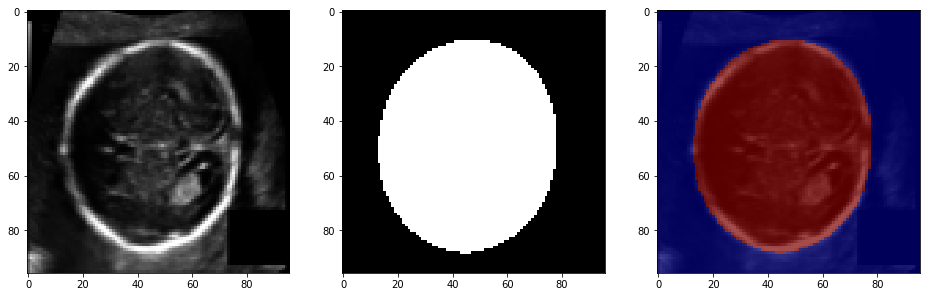

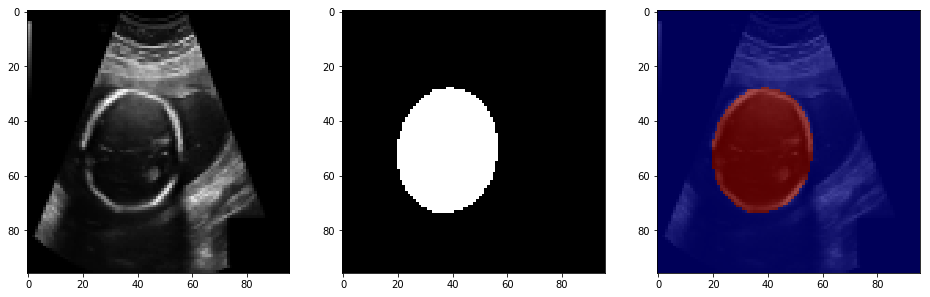

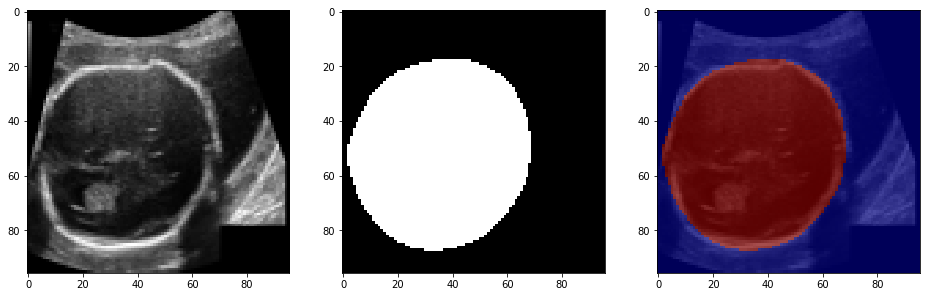

In [29]:
for test, pred in zip(X_test,y_pred):
    fig, ax = plt.subplots(1,3,figsize = (16,12))
    test = test.reshape((IMG_HEIGHT,IMG_WIDTH))

    pred = pred.reshape((IMG_HEIGHT,IMG_WIDTH))
    pred = pred>0.5
    ax[0].imshow(test, cmap = 'gray')

    ax[1].imshow(pred, cmap = 'gray')

    ax[2].imshow(test, cmap = 'gray', interpolation = 'none')
    ax[2].imshow(pred, cmap = 'jet', interpolation = 'none', alpha = 0.7)

In [30]:
# print(test1)

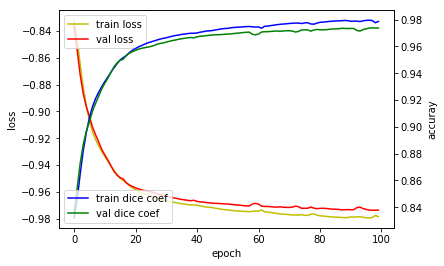

In [31]:
fig, loss_ax = plt.subplots()

acc_ax = loss_ax.twinx()

loss_ax.plot(results.history['loss'], 'y', label='train loss')
loss_ax.plot(results.history['val_loss'], 'r', label='val loss')

acc_ax.plot(results.history['dice_coef'], 'b', label='train dice coef')
acc_ax.plot(results.history['val_dice_coef'], 'g', label='val dice coef')

loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
acc_ax.set_ylabel('accuray')

loss_ax.legend(loc='upper left')
acc_ax.legend(loc='lower left')

plt.show()

In [32]:
# rles = []
# for i in range(X_test.shape[0]):
#     img = y_pred[i, :, :, 0]
#     img = img > 0.5
#     img = resize(img, (420, 580), preserve_range=True)
#     rle = run_length_enc(img)
#     rles.append(rle)
#     if i % 100 == 0:
#             print('{}/{}'.format(i, X_test.shape[0]), end = "\r")

In [33]:
# sub['pixels'] = rles
# sub.to_csv("submission.csv", index = False)

In [34]:
model.save('HC-96.h5')